In [36]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, jaccard_score, roc_auc_score, accuracy_score, classification_report, balanced_accuracy_score
from sklearn.metrics import confusion_matrix
# from sklearn.externals import joblib
import joblib
from sklearn.decomposition import SparsePCA, PCA
import os
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
"""
Master, Slave1, Slave2, Slave3

10.251.0.114, 10.251.0.105, 10.251.0.25, 10.251.0.192
"""
# path_parent = os.path.dirname(os.getcwd())
# data_dir = os.path.join(path_parent,'data')
# model_dir = os.path.join(path_parent,'models')
# processed_dir = os.path.join(data_dir,'processed')
# df_audsome = pd.read_csv(os.path.join(processed_dir,"anomaly_anotated_audsome.csv"))

print("Checking files in data location ...")
drop_dir = '/Users/Gabriel/Dropbox/Research/ASPIDE/Datasets/ECI Chaos/Distributed Phase 1'
data_dir = drop_dir
print("Data dir: {}".format(data_dir))
processed_dir = os.path.join(data_dir, 'processed')
print("Processed dir: {}".format(processed_dir))
anomaly_labeled = os.path.join(processed_dir, 'df_anomaly.csv')
df_anomaly = pd.read_csv(anomaly_labeled)
clean_data = os.path.join(data_dir, 'clean_audsome_(65m).csv')
df_clean_data = pd.read_csv(clean_data)

Checking files in data location ...
Data dir: /Users/Gabriel/Dropbox/Research/ASPIDE/Datasets/ECI Chaos/Distributed Phase 1
Processed dir: /Users/Gabriel/Dropbox/Research/ASPIDE/Datasets/ECI Chaos/Distributed Phase 1/processed


In [37]:
print("Shape: {}".format(df_anomaly.shape))

# Get columns based on name wildcard
mask_ano = df_anomaly.columns.str.contains('target*')
df_target = df_anomaly.loc[:,mask_ano]
drop_list = list(df_target.columns.values)
drop_list_clean = []
#Remove any other unwanted column

drop_col_wildcard = ['node_time_seconds_*',
                     'context_switches_total_*',
                     'node_forks_total__*',
                     'node_intr_total_*',
                     'node_entropy_available_bits_*',
                     'node_cpu_seconds_total_*',
                     'node_disk_io_time_seconds_total_*',
                     'node_disk_io_time_weighted_seconds_total_*',
                     'node_disk_read_time_seconds_total_*',
                     'node_disk_write_time_seconds_total_*']

for dc in drop_col_wildcard:
    mask = df_anomaly.columns.str.contains(dc)
    mask_clean =df_clean_data.columns.str.contains(dc)
    drop_list.extend(list(df_anomaly.loc[:,mask].columns.values))
    drop_list_clean.extend(list(df_clean_data.loc[:, mask_clean].columns.values))










print("Target droplist: {}".format(drop_list))



# df_anomaly.columns
# print("Checking low variance columns ...")
# print("Starting Clean dataset")
# uniques = df_audsome.apply(lambda x: x.nunique())
# rm_columns = []
# for uindex, uvalue in uniques.iteritems():
#     if uvalue == 1:
#         rm_columns.append(uindex)
# print(rm_columns)

Shape: (3900, 793)
Target droplist: ['target_cpu_2', 'target_mem_2', 'target_copy_2', 'target_dummy_2', 'target_ddot_2', 'target_cpu_3', 'target_mem_3', 'target_copy_3', 'target_dummy_3', 'target_ddot_3', 'target_cpu_1', 'target_mem_1', 'target_copy_1', 'target_dummy_1', 'target_ddot_1', 'target_cpu_master', 'target_mem_master', 'target_copy_master', 'target_dummy_master', 'target_ddot_master', 'node_time_seconds_10.251.0.105:9100', 'node_time_seconds_10.251.0.114:9100', 'node_time_seconds_10.251.0.192:9100', 'node_time_seconds_10.251.0.25:9100', 'node_context_switches_total_10.251.0.105:9100', 'node_context_switches_total_10.251.0.114:9100', 'node_context_switches_total_10.251.0.192:9100', 'node_context_switches_total_10.251.0.25:9100', 'node_forks_total_10.251.0.105:9100', 'node_forks_total_10.251.0.114:9100', 'node_forks_total_10.251.0.192:9100', 'node_forks_total_10.251.0.25:9100', 'node_intr_total_10.251.0.105:9100', 'node_intr_total_10.251.0.114:9100', 'node_intr_total_10.251.0.1

In [38]:
print("Dataset chosen ...")


data = df_anomaly
# drop_col = ['t1','t2','t3','t4']
# drop_col = ['t1','t2','t3','t4',
# 'node_time_seconds_10.211.55.101:9100',
# 'node_context_switches_total_10.211.55.101:9100',
# 'node_forks_total_10.211.55.101:9100',
# 'node_intr_total_10.211.55.101:9100',
# 'node_entropy_available_bits_10.211.55.101:9100',
# 'node_cpu_seconds_total_10.211.55.101:9100']
drop_col = drop_list
print("Remove unwanted columns ...")
print("Shape before drop: {}".format(data.shape))
print("Clean shape before drop: {}".format(df_clean_data.shape))
data.drop(drop_col, axis=1, inplace=True)
df_clean_data.drop(["Unnamed: 0"], axis=1, inplace=True)
df_clean_data.drop(drop_list_clean, axis=1, inplace=True)
print("Shape after drop: {}".format(data.shape))
print("Clean shape after drop: {}".format(df_clean_data.shape))

Dataset chosen ...
Remove unwanted columns ...
Shape before drop: (3900, 793)
Clean shape before drop: (3900, 774)
Shape after drop: (3900, 733)
Clean shape after drop: (3900, 733)


In [39]:
print("Checking low variance columns ...")
print("Starting Clean dataset")
uniques = data.apply(lambda x: x.nunique())
rm_columns = []
for uindex, uvalue in uniques.iteritems():
    if uvalue == 1:
        rm_columns.append(uindex)

data =  data.drop(rm_columns, axis=1)
df_clean_data = df_clean_data.drop(rm_columns, axis=1)
print("Shape after low variance drop: {}".format(data.shape))
print("Clean shape after low variance drop: {}".format(df_clean_data.shape))

Checking low variance columns ...
Starting Clean dataset
Shape after low variance drop: (3900, 275)
Clean shape after low variance drop: (3900, 275)


In [40]:
# # Nice print
# nice_y = data['target']
#
# # Uncomment for removing dummy
# print("Removed Dummy class")
# data.loc[data.target == "dummy", 'target'] = "0"
# # Uncomment for removing cpu
# data.loc[data.target == "cpu", 'target'] = "0"
# # Uncomment for removing copy
# data.loc[data.target == "copy", 'target'] = "0"
#
# # Uncomment for manual factorize mem
# data.loc[data.target == "mem", 'target'] = 1
# # Print new unique columns
# print(data['target'].unique())


In [41]:
# # time = data.drop('time', axis=1)
# X = data.drop('target', axis=1)
# y = data['target']
# # print(y)

time = data.drop('time', axis=1)
clean_time = df_clean_data.drop('time', axis=1)
X = data
y = df_target

In [42]:
# time
# Pearson correlation
# plt.subplots(figsize=(35, 35))
# sns.heatmap(time.corr())
# plt.show()

In [43]:
# plt.subplots(figsize=(35, 35))
# sns.heatmap(clean_time.corr())
# plt.show()

In [44]:
print("Data shape:{}".format(X.shape))
print("Ground truth shape: {}".format(y.shape))

y.columns

Data shape:(3900, 275)
Ground truth shape: (3900, 20)


Index(['target_cpu_2', 'target_mem_2', 'target_copy_2', 'target_dummy_2',
       'target_ddot_2', 'target_cpu_3', 'target_mem_3', 'target_copy_3',
       'target_dummy_3', 'target_ddot_3', 'target_cpu_1', 'target_mem_1',
       'target_copy_1', 'target_dummy_1', 'target_ddot_1', 'target_cpu_master',
       'target_mem_master', 'target_copy_master', 'target_dummy_master',
       'target_ddot_master'],
      dtype='object')

In [45]:

# 2D anomaly visualization PCA

# Get anomaly index and the values based on said index
for c in y.columns:
    anomaly_index_rf = np.where(y[c]==1)
    print(c)
    print(anomaly_index_rf)

anomaly_index_cpu_master = np.where(y['target_cpu_master']==1)
anomaly_index_cpu_1 = np.where(y['target_cpu_1']==1)
anomaly_index_cpu_2 = np.where(y['target_cpu_2']==1)
anomaly_index_cpu_3 = np.where(y['target_cpu_3']==1)
anomaly_index_mem = np.where(y['target_mem_2']==1)

target_cpu_2
(array([2973, 2974, 2975, 2976, 2977, 2978, 2979, 2980, 2981, 2982, 2983,
       2984, 2985, 2986, 2987, 2988]),)
target_mem_2
(array([2797, 2798, 2799, 2800, 2801, 2802, 2803, 2804, 2805, 2806, 2807,
       2808, 2809, 2810, 2811, 2812, 2813, 2814, 2815, 2816, 2817, 2818,
       2819, 2820, 2821, 2822, 2823, 2824, 2825, 2826, 2827, 2828, 2829,
       2830, 2831, 2832, 2833, 2834, 2835, 2836, 2837, 2838, 2839, 2840,
       2841, 2842]),)
target_copy_2
(array([2842, 2843, 2844, 2845, 2846, 2847, 2848, 2849, 2850, 2851, 2852,
       2853, 2854, 2855, 2856, 2857, 2858, 2859, 2860, 2861, 2862, 2863,
       2864, 2865, 2866, 2867, 2868, 2869, 2870, 2871, 2872, 2873, 2874,
       2875, 2876, 2877, 2878, 2879, 2880, 2881, 2882, 2883, 2884, 2885,
       2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896,
       2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907,
       2908, 2909, 2910, 2911, 2912, 2913, 2914, 2915, 2916, 2917, 2918,
       2919, 2920, 

Initial shape: (3900, 274)
PCA data shape: (3900, 2)
(3900,)
(3900,)


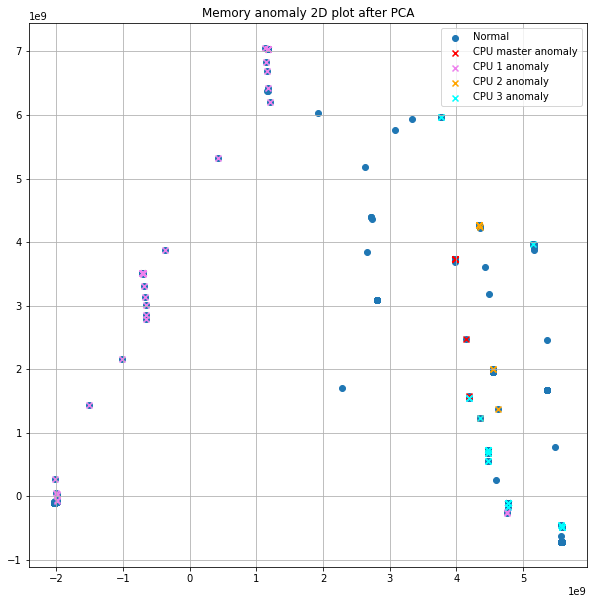

In [34]:
# print(anomaly_index_rf)
X_t = X.drop('time', axis=1)
transformer = PCA(n_components=2)
transformer.fit(X_t)
X_transformed = transformer.transform(X_t)
print("Initial shape: {}".format(X_t.shape))
print("PCA data shape: {}".format(X_transformed.shape))
dataset_rf  = X_transformed

# Get anomalies based on index
values_cpu_master = dataset_rf[anomaly_index_cpu_master]
values_cpu_1 = dataset_rf[anomaly_index_cpu_1]
values_cpu_2 = dataset_rf[anomaly_index_cpu_2]
values_cpu_3 = dataset_rf[anomaly_index_cpu_3]
print(dataset_rf[:,0].shape)
print(dataset_rf[:,1].shape)


values_mem = dataset_rf[anomaly_index_mem]

#Plot prediction on 2d
fig = plt.figure(figsize=(10,10))
plt.scatter(dataset_rf[:,0], dataset_rf[:,1], label='Normal')
plt.scatter(values_cpu_master[:,0], values_cpu_master[:,1], color='red', marker='x', label='CPU master anomaly')
plt.scatter(values_cpu_1[:,0], values_cpu_1[:,1], color='violet', marker='x', label='CPU 1 anomaly')
plt.scatter(values_cpu_2[:,0], values_cpu_2[:,1], color='orange', marker='x', label='CPU 2 anomaly')
plt.scatter(values_cpu_3[:,0], values_cpu_3[:,1], color='cyan', marker='x', label='CPU 3 anomaly')
# plt.scatter(values_mem[:,0], values_mem[:,1], color='green', marker='x', label='Memory anomaly')
plt.grid()
plt.legend()
plt.title("Memory anomaly 2D plot after PCA")
plt.show()

(3900, 3)


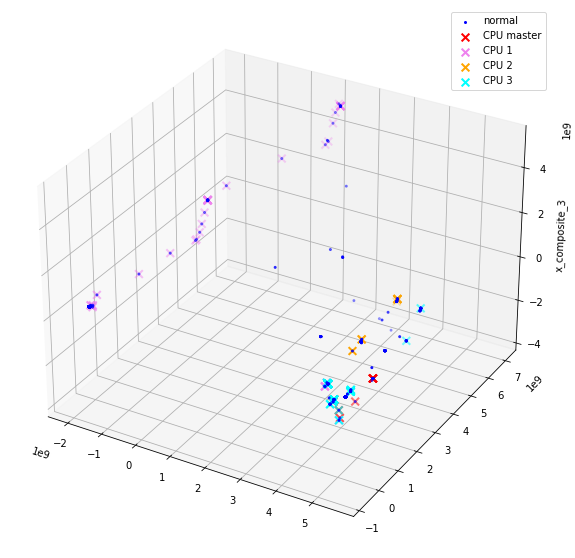

In [47]:
# Data preprocessing options (3d)
transformer = PCA(n_components=3)
transformer.fit(X_t)
X_transformed_3d = transformer.transform(X_t)
print(X_transformed_3d.shape)


# Plot 3D anomaly map
fig = plt.figure(figsize=(10,10))

ax = fig.add_subplot(111, projection='3d')
ax.set_zlabel("x_composite_3")
# Plot the compressed data points
ax.scatter(X_transformed_3d[:, 0], X_transformed_3d[:, 1], zs=X_transformed_3d[:, 2], s=4, lw=1, label="normal",c="blue")
# Plot x's for the ground truth outliers
ax.scatter(X_transformed_3d[anomaly_index_cpu_master,0],X_transformed_3d[anomaly_index_cpu_master,1], X_transformed_3d[anomaly_index_cpu_master,2],
           lw=2, s=60, marker="x", c="red", label="CPU master")
ax.scatter(X_transformed_3d[anomaly_index_cpu_1,0],X_transformed_3d[anomaly_index_cpu_1,1], X_transformed_3d[anomaly_index_cpu_1,2],
           lw=2, s=60, marker="x", c="violet", label="CPU 1")
ax.scatter(X_transformed_3d[anomaly_index_cpu_2,0],X_transformed_3d[anomaly_index_cpu_2,1], X_transformed_3d[anomaly_index_cpu_2,2],
           lw=2, s=60, marker="x", c="orange", label="CPU 2")
ax.scatter(X_transformed_3d[anomaly_index_cpu_3,0],X_transformed_3d[anomaly_index_cpu_3,1], X_transformed_3d[anomaly_index_cpu_3,2],
           lw=2, s=60, marker="x", c="cyan", label="CPU 3")

ax.legend()
plt.show()

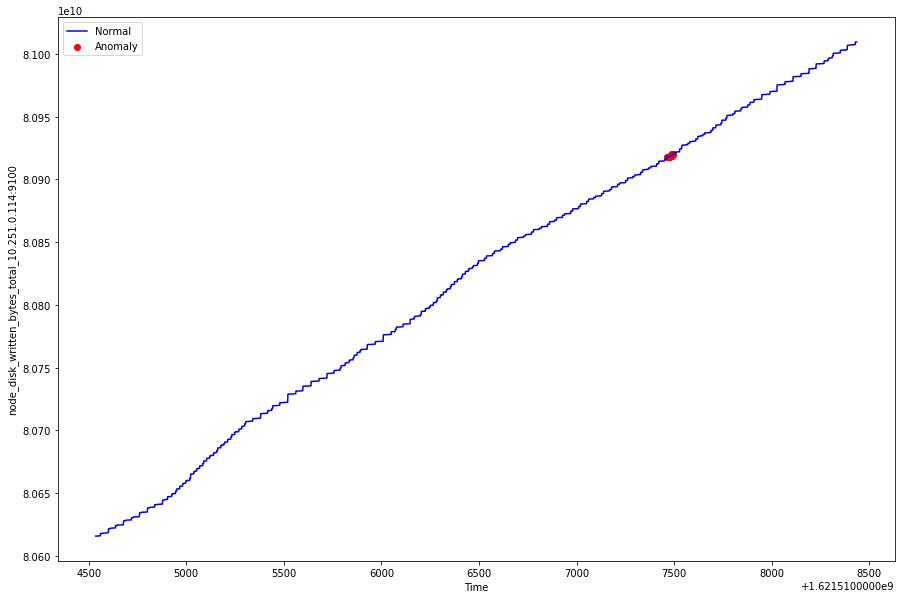

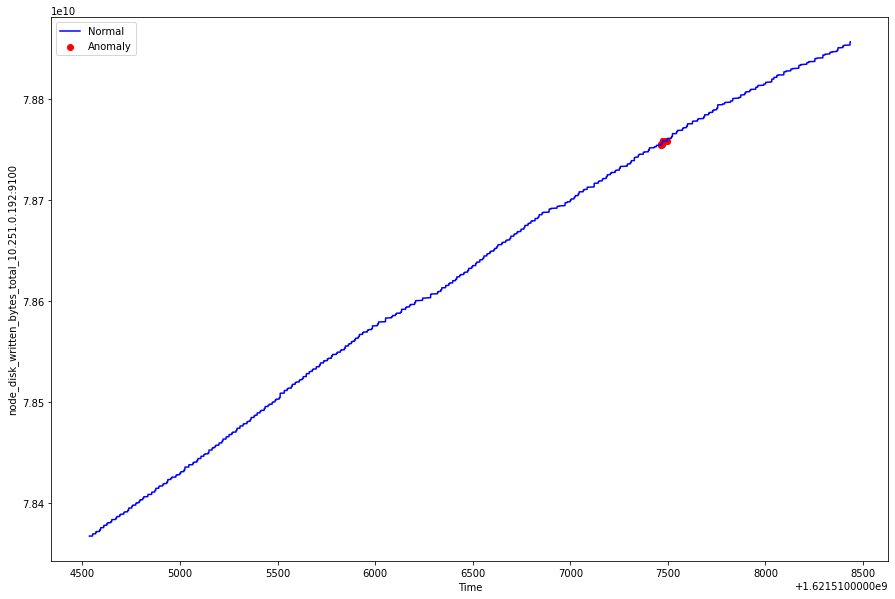

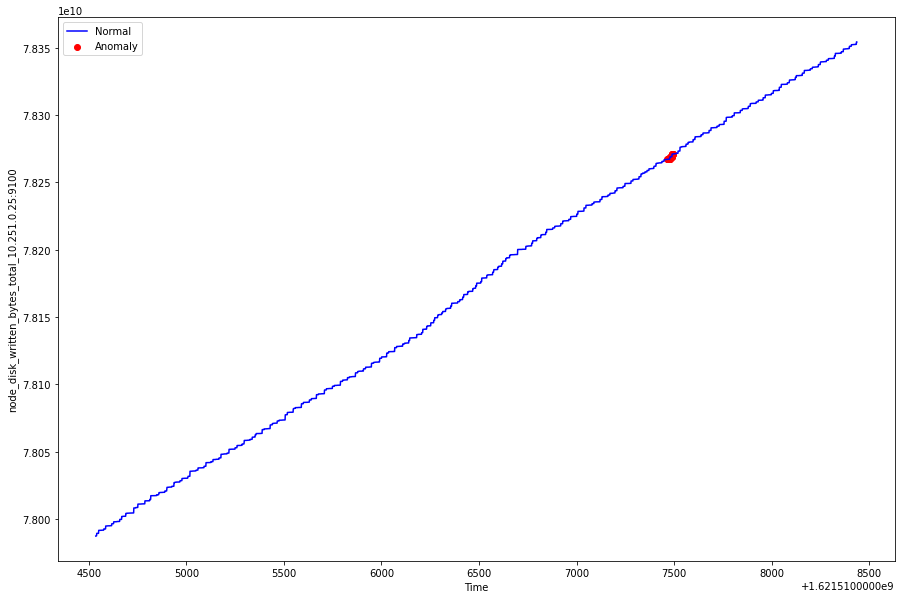

['node_disk_read_bytes_total_10.251.0.105:9100'
 'node_disk_read_bytes_total_10.251.0.114:9100'
 'node_disk_read_bytes_total_10.251.0.192:9100'
 'node_disk_read_bytes_total_10.251.0.25:9100'
 'node_disk_reads_completed_total_10.251.0.105:9100'
 'node_disk_reads_completed_total_10.251.0.114:9100'
 'node_disk_reads_completed_total_10.251.0.192:9100'
 'node_disk_reads_completed_total_10.251.0.25:9100'
 'node_disk_writes_completed_total_10.251.0.105:9100'
 'node_disk_writes_completed_total_10.251.0.114:9100'
 'node_disk_writes_completed_total_10.251.0.192:9100'
 'node_disk_writes_completed_total_10.251.0.25:9100'
 'node_disk_writes_merged_total_10.251.0.105:9100'
 'node_disk_writes_merged_total_10.251.0.114:9100'
 'node_disk_writes_merged_total_10.251.0.192:9100'
 'node_disk_writes_merged_total_10.251.0.25:9100'
 'node_disk_written_bytes_total_10.251.0.105:9100'
 'node_disk_written_bytes_total_10.251.0.114:9100'
 'node_disk_written_bytes_total_10.251.0.192:9100'
 'node_disk_written_bytes_t

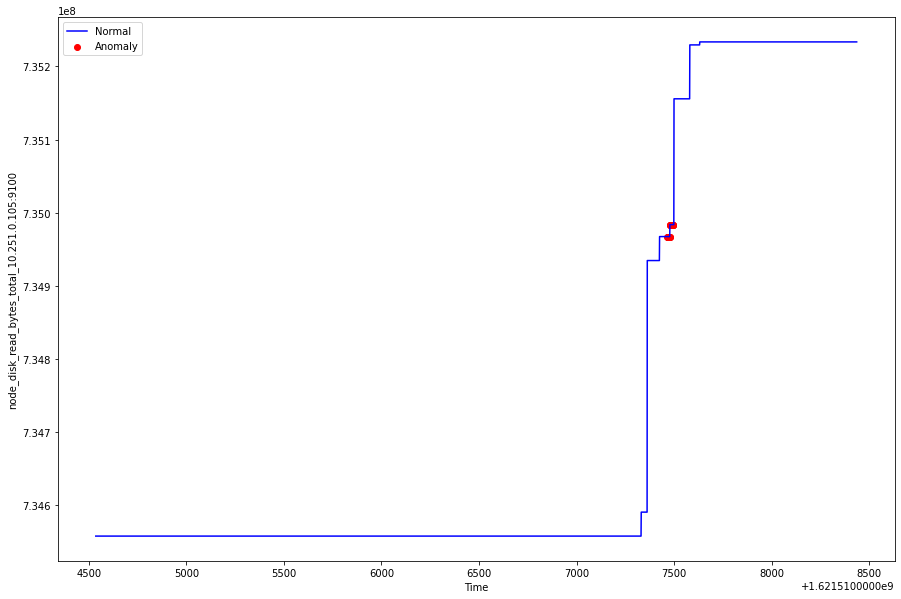

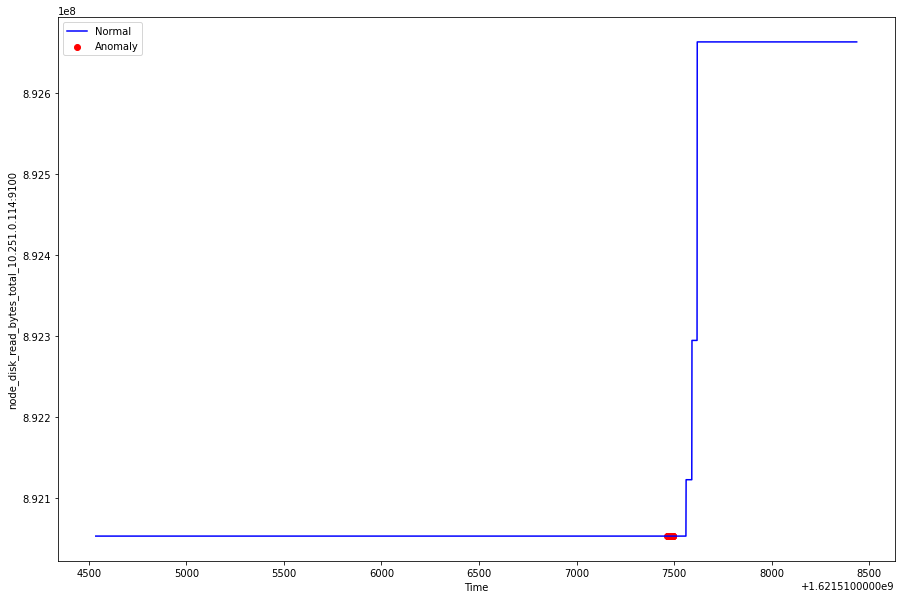

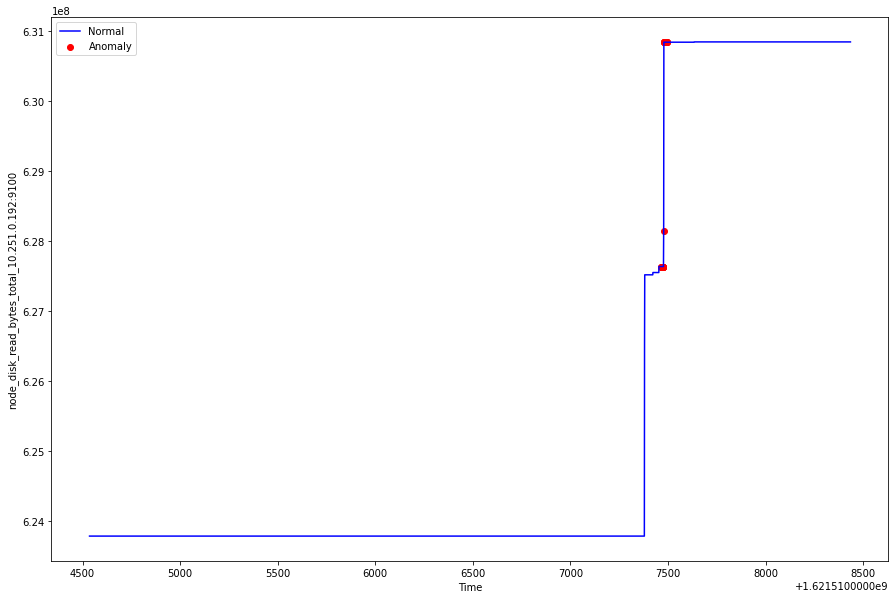

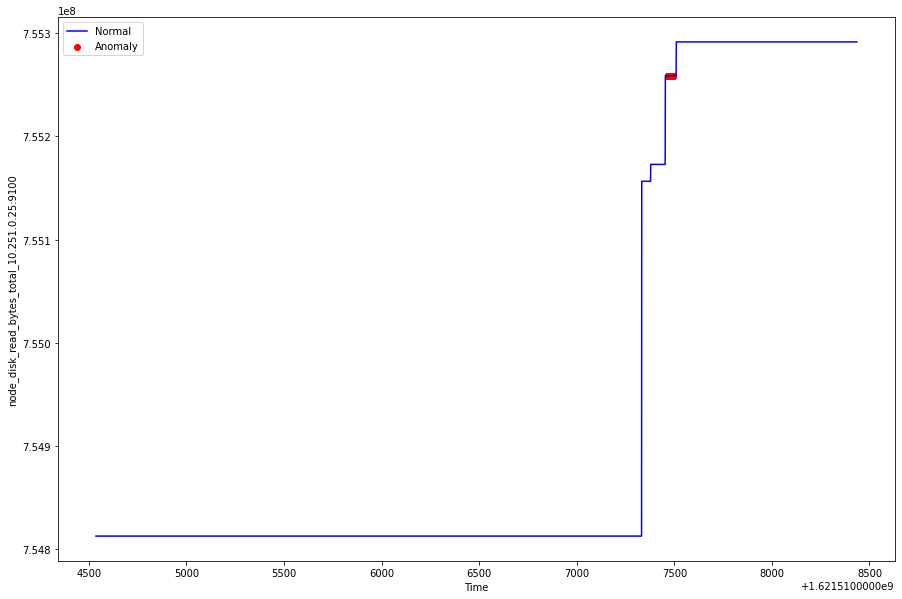

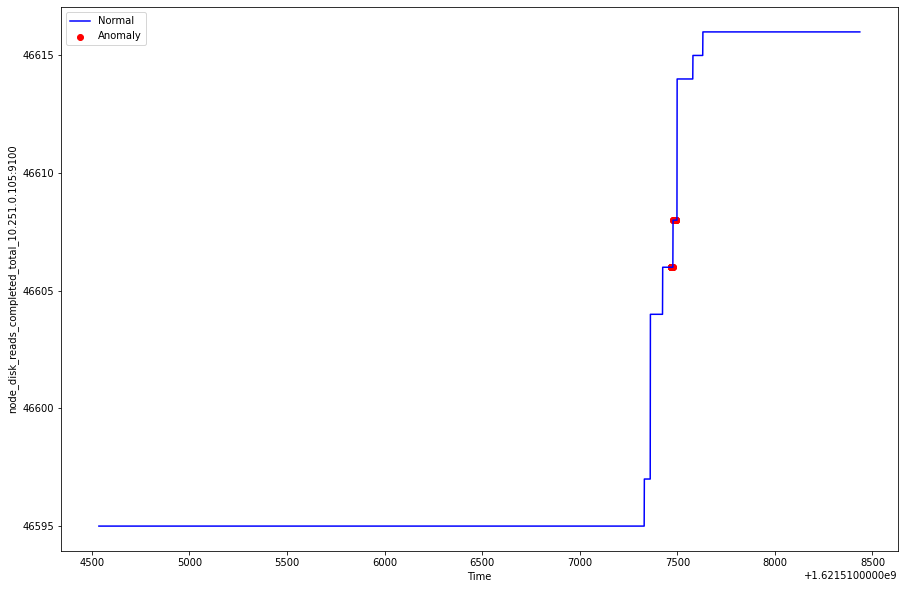

...

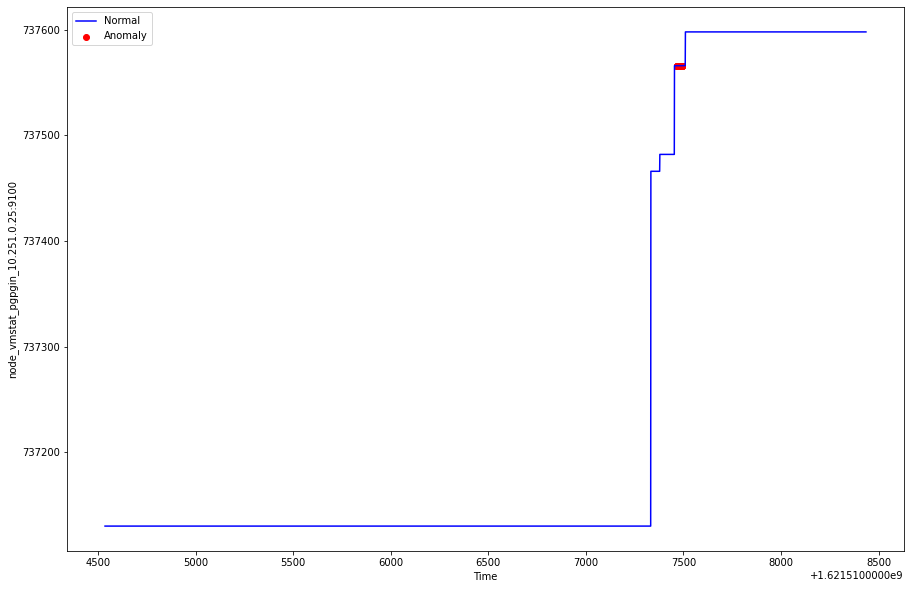

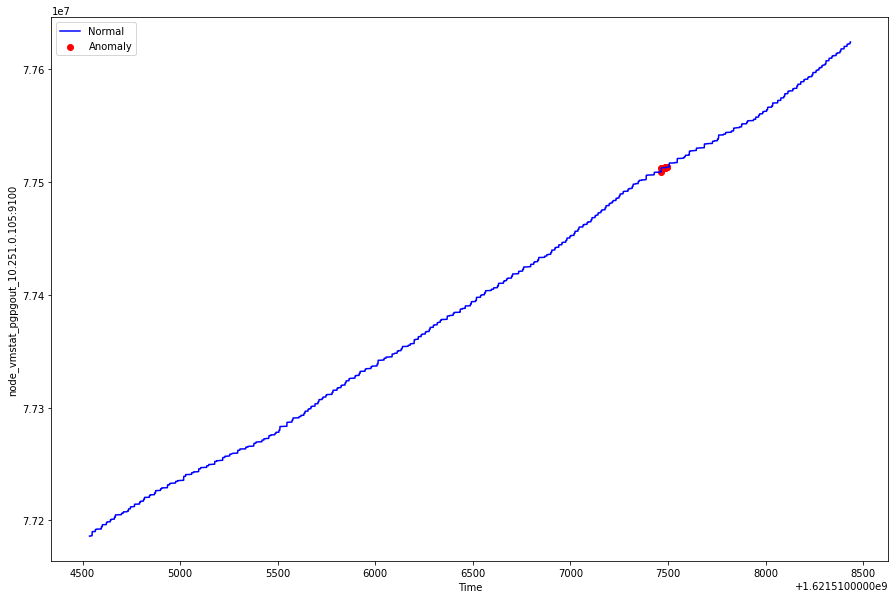

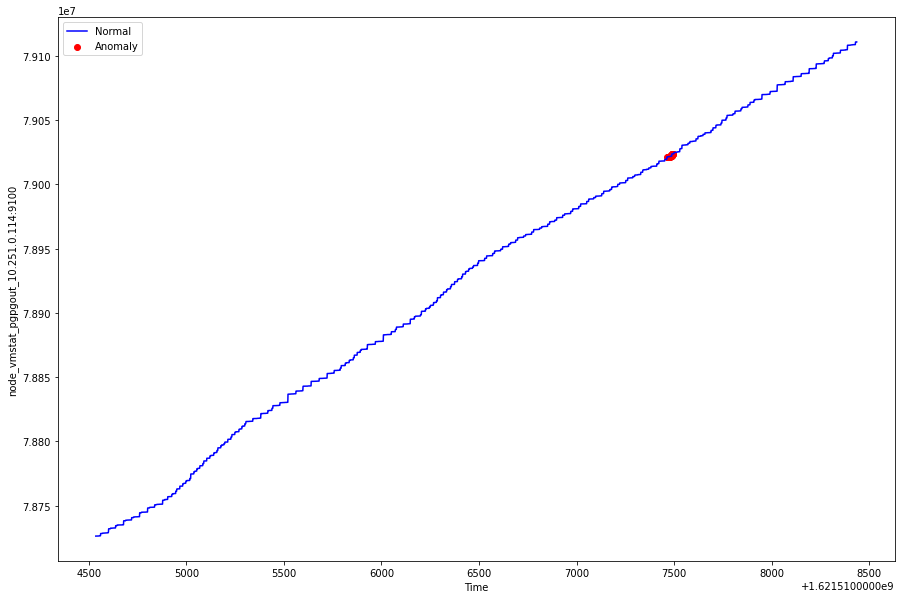

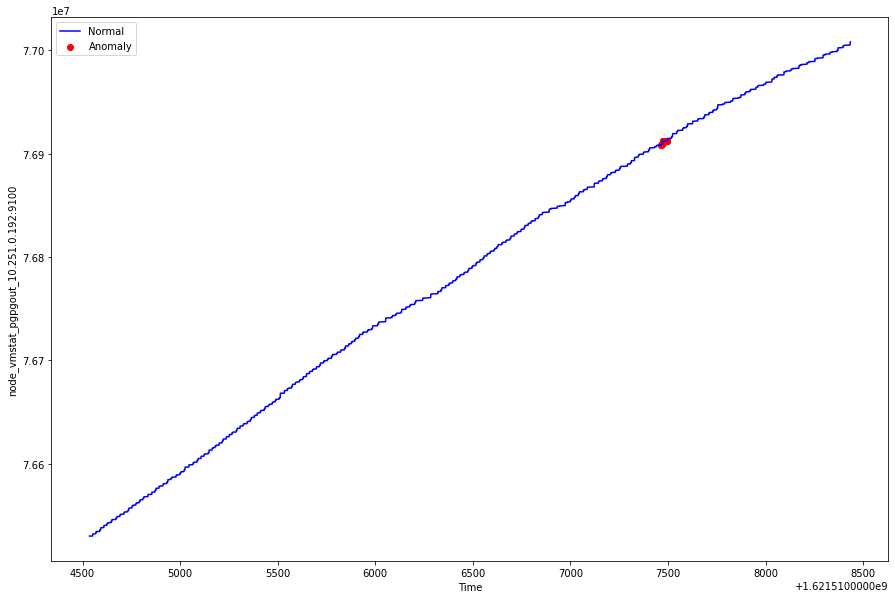

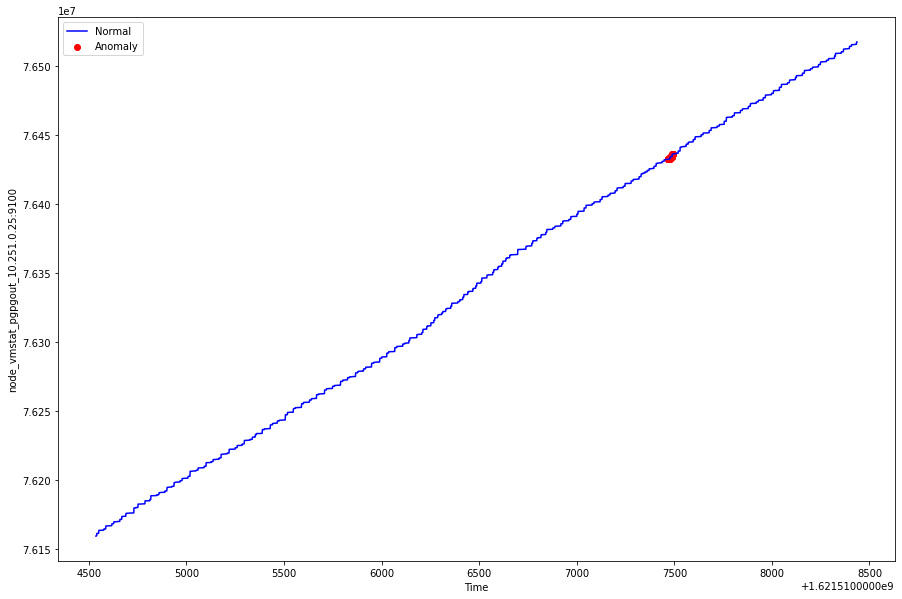

In [49]:
# Add anomalies to all columns from raw dataframe

df_plot = X
print(df_plot.columns.values)
col_names_plt = list(df_plot.columns.values)
df_plot['anomaly'] = y['target_cpu_master']
# df_plot['time'] = time
for feature in col_names_plt:
    if feature == 'time' or feature == 'anomaly':
        pass
    else:
        fig, ax = plt.subplots(figsize=(15,10))
        a = df_plot.loc[df_plot['anomaly'] == 1, ['time', feature]] #anomaly
        ax.plot(df_plot['time'], df_plot[feature], color='blue', label='Normal')
        ax.scatter(a['time'],a[feature], color='red', label='Anomaly')
        plt.xlabel('Time')
        plt.ylabel(feature)
        plt.legend()
        plt.show();




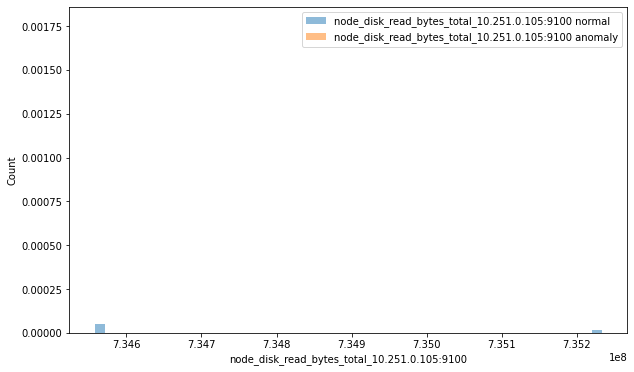

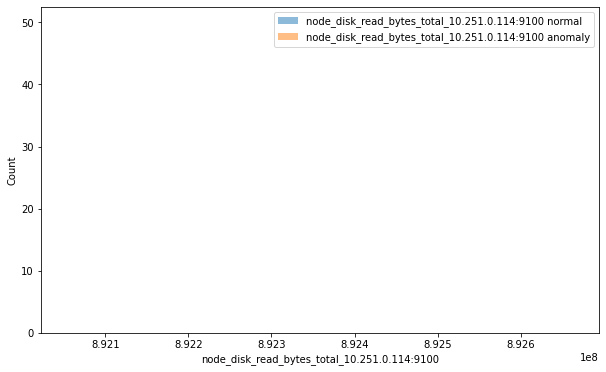

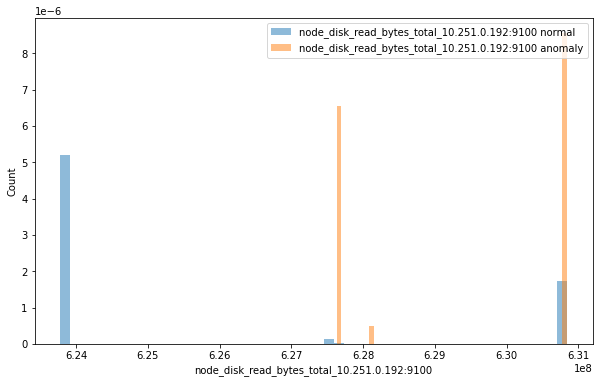

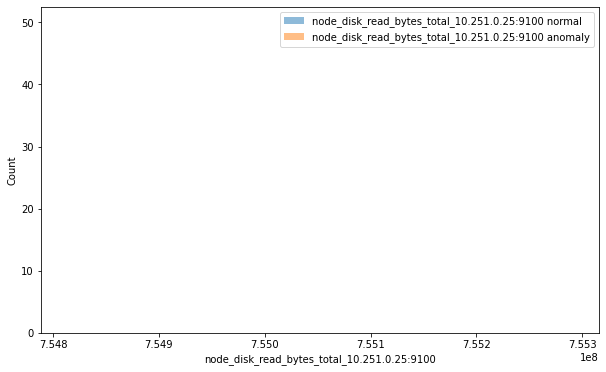

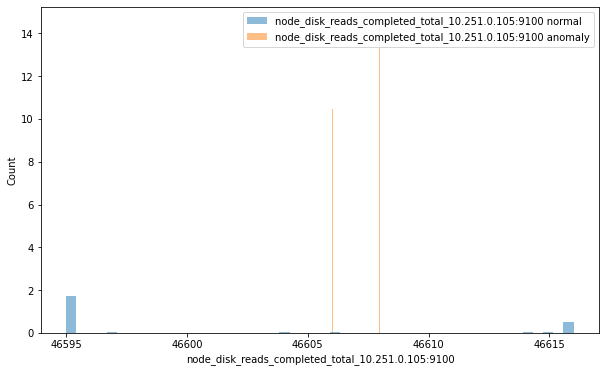

...

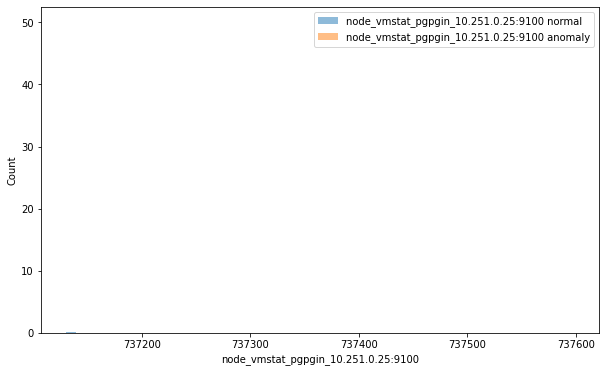

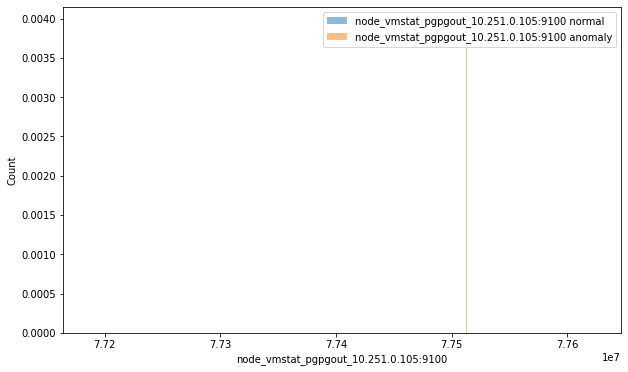

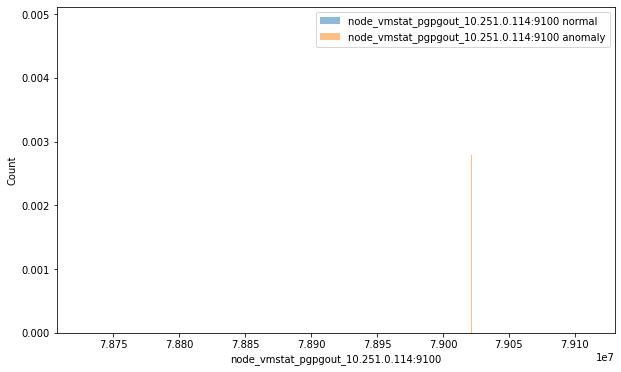

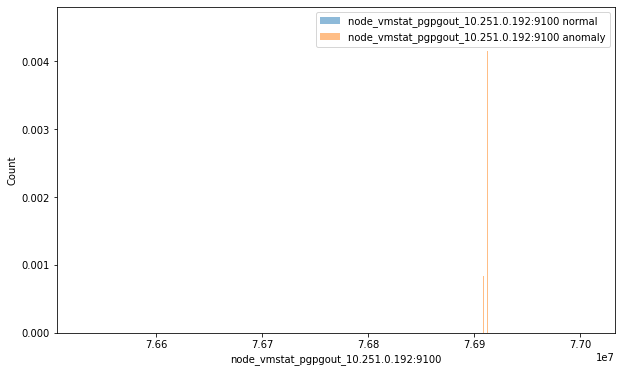

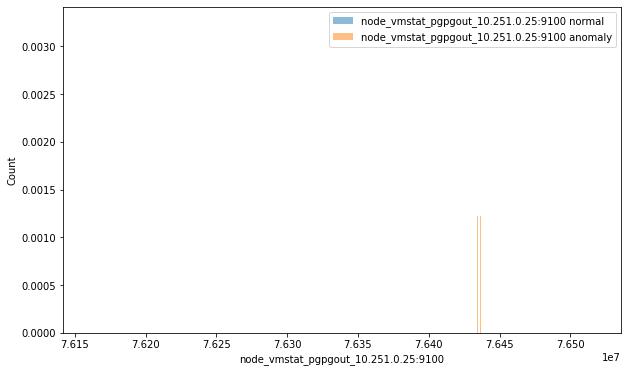

In [50]:
# Feature separability (normalized)
# print(df_plot.columns.values)
for feature in col_names_plt:
    if feature == 'time' or feature == 'anomaly' or feature == 'id':
        pass
    else:
        normal_event = df_plot.loc[df_plot['anomaly'] == 0, feature]
        anomay_event = df_plot.loc[df_plot['anomaly'] == 1, feature]

        plt.figure(figsize=(10, 6))
        plt.hist(normal_event, bins = 50, alpha=0.5, density=True,label='{} normal'.format(feature))
        plt.hist(anomay_event, bins = 50, alpha=0.5, density=True, label='{} anomaly'.format(feature))
        plt.legend(loc='upper right')
        plt.xlabel(feature)
        plt.ylabel('Count')
        plt.show();